# Importing libraries and reading in Close Price data

In [1]:
import panel as pn
pn.extension('plotly')
import plotly.graph_objects as go

In [2]:
# Import libraries
import pandas as pd
import hvplot.pandas
from pathlib import Path
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt


Bad key "text.kerning_factor" on line 4 in
C:\Users\ikki_\anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [3]:
# Read in Close price data
close_df = pd.read_csv('close_df.csv')
close_df.head()

,Date,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
0,2009-05-27,NaN,NaN,16.476213,NaN,NaN,35.236958,53.609131,NaN,NaN,...,34.176460,5.890142,17.025055,14.234203,16.297838,16.762238,20.466381,19.260120,64.907356,NaN
1,2009-05-28,NaN,NaN,16.840023,NaN,NaN,35.785748,53.580708,NaN,NaN,...,35.311043,6.056561,17.189442,14.440978,16.470680,17.109844,20.571711,19.184195,65.921387,NaN
2,2009-05-29,NaN,NaN,17.185333,NaN,NaN,36.236252,53.290588,NaN,NaN,...,35.972301,6.167504,17.604301,14.598120,16.650732,17.232151,20.928213,19.504778,66.817574,NaN
3,2009-06-01,NaN,NaN,17.727961,NaN,NaN,37.202759,53.893333,NaN,NaN,...,37.294807,6.233061,18.418367,15.011671,16.982014,17.785748,21.065948,20.441204,68.539108,NaN
4,2009-06-02,NaN,NaN,17.746462,NaN,NaN,37.063526,54.293674,NaN,NaN,...,37.197357,6.132203,18.449684,14.978585,17.154863,17.573318,21.195581,20.609932,68.680595,NaN


In [4]:
# sort index by date order
close_df = close_df.sort_index(ascending=True)
close_df.head()

,Date,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
0,2009-05-27,NaN,NaN,16.476213,NaN,NaN,35.236958,53.609131,NaN,NaN,...,34.176460,5.890142,17.025055,14.234203,16.297838,16.762238,20.466381,19.260120,64.907356,NaN
1,2009-05-28,NaN,NaN,16.840023,NaN,NaN,35.785748,53.580708,NaN,NaN,...,35.311043,6.056561,17.189442,14.440978,16.470680,17.109844,20.571711,19.184195,65.921387,NaN
2,2009-05-29,NaN,NaN,17.185333,NaN,NaN,36.236252,53.290588,NaN,NaN,...,35.972301,6.167504,17.604301,14.598120,16.650732,17.232151,20.928213,19.504778,66.817574,NaN
3,2009-06-01,NaN,NaN,17.727961,NaN,NaN,37.202759,53.893333,NaN,NaN,...,37.294807,6.233061,18.418367,15.011671,16.982014,17.785748,21.065948,20.441204,68.539108,NaN
4,2009-06-02,NaN,NaN,17.746462,NaN,NaN,37.063526,54.293674,NaN,NaN,...,37.197357,6.132203,18.449684,14.978585,17.154863,17.573318,21.195581,20.609932,68.680595,NaN


In [5]:
# Make date the reference:
close_df = close_df.set_index(close_df["Date"]).drop(columns=["Date"])
close_df.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2009-05-27,NaN,NaN,16.476213,NaN,NaN,35.236958,53.609131,NaN,NaN,29.562580,...,34.176460,5.890142,17.025055,14.234203,16.297838,16.762238,20.466381,19.260120,64.907356,NaN
2009-05-28,NaN,NaN,16.840023,NaN,NaN,35.785748,53.580708,NaN,NaN,29.902758,...,35.311043,6.056561,17.189442,14.440978,16.470680,17.109844,20.571711,19.184195,65.921387,NaN
2009-05-29,NaN,NaN,17.185333,NaN,NaN,36.236252,53.290588,NaN,NaN,29.756962,...,35.972301,6.167504,17.604301,14.598120,16.650732,17.232151,20.928213,19.504778,66.817574,NaN
2009-06-01,NaN,NaN,17.727961,NaN,NaN,37.202759,53.893333,NaN,NaN,30.558807,...,37.294807,6.233061,18.418367,15.011671,16.982014,17.785748,21.065948,20.441204,68.539108,NaN
2009-06-02,NaN,NaN,17.746462,NaN,NaN,37.063526,54.293674,NaN,NaN,30.574997,...,37.197357,6.132203,18.449684,14.978585,17.154863,17.573318,21.195581,20.609932,68.680595,NaN


# Calculating daily returns

In [6]:
# compute daily returns
daily_returns_df = close_df.pct_change()

In [7]:
daily_returns_df.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2009-05-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-05-28,NaN,NaN,0.022081,NaN,NaN,0.015574,-0.000530,NaN,NaN,0.011507,...,0.033198,0.028254,0.009656,0.014527,0.010605,0.020737,0.005146,-0.003942,0.015623,NaN
2009-05-29,NaN,NaN,0.020505,NaN,NaN,0.012589,-0.005415,NaN,NaN,-0.004876,...,0.018727,0.018318,0.024135,0.010882,0.010932,0.007148,0.017330,0.016711,0.013595,NaN
2009-06-01,NaN,NaN,0.031575,NaN,NaN,0.026672,0.011311,NaN,NaN,0.026946,...,0.036765,0.010629,0.046242,0.028329,0.019896,0.032126,0.006581,0.048010,0.025765,NaN
2009-06-02,NaN,NaN,0.001044,NaN,NaN,-0.003743,0.007428,NaN,NaN,0.000530,...,-0.002613,-0.016181,0.001700,-0.002204,0.010178,-0.011944,0.006154,0.008254,0.002064,NaN


In [8]:
daily_returns_df.tail()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2021-05-20,0.010609,0.012777,0.015794,0.008670,-0.008186,0.000705,0.006960,0.004476,0.006399,0.015206,...,-0.001535,0.000538,0.002248,0.019126,0.009238,0.008736,0.010483,0.010258,0.010642,0.000487
2021-05-21,-0.011776,-0.012948,-0.018214,-0.032366,0.034388,0.000000,-0.001975,-0.032086,-0.001613,-0.006033,...,0.002113,0.009944,0.004876,-0.005477,0.000141,0.005166,0.000161,-0.005018,-0.000754,0.000000
2021-05-24,0.003175,0.004036,0.013575,0.033811,-0.037234,-0.000705,0.001079,-0.018416,0.002308,-0.002511,...,0.009969,0.004790,0.006211,0.017769,0.002957,-0.001814,0.000965,0.009908,0.010017,0.000000
2021-05-25,-0.008244,-0.009715,0.000446,-0.025866,0.029696,-0.021509,0.004851,-0.013759,0.001934,-0.010491,...,-0.020311,-0.010063,-0.002990,0.000289,0.000281,-0.012114,-0.002972,0.003172,-0.002112,0.000000
2021-05-26,0.012529,0.016005,0.011156,0.025022,-0.030181,0.007928,-0.000089,-0.002854,0.001608,0.004665,...,0.008913,0.002943,0.003192,-0.000072,-0.002105,0.000153,-0.005801,0.009546,0.001885,0.000000


In [9]:
# Setting dataframe for 1 year timeframe
daily_returns_1yr = daily_returns_df.loc["2020-05-21":"2021-05-21"]
daily_returns_1yr.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2020-05-21,0.006370,0.008780,0.043544,0.086738,-0.082993,-0.004419,-0.000283,-0.002911,0.004124,0.000329,...,-0.016010,-0.003172,0.002353,-0.013949,-0.011052,-0.010101,-0.007389,0.003554,-0.007707,0.000000
2020-05-22,0.018724,0.018781,-0.006475,-0.014431,0.015208,-0.010492,-0.004529,-0.016058,-0.000489,0.006912,...,-0.006198,-0.003636,-0.000783,0.003640,0.003492,0.011099,0.002113,-0.001483,0.002528,0.000000
2020-05-26,0.003655,0.004047,0.076032,0.156724,-0.166971,0.001631,0.006161,0.009273,0.004892,0.039882,...,0.027807,0.052007,0.041980,-0.001036,0.005394,0.006551,-0.001807,0.015838,0.012315,0.000000
2020-05-27,-0.000728,0.000896,0.045087,0.094233,-0.084649,-0.010586,0.001695,0.000735,0.005404,0.013832,...,0.012895,0.043365,0.033373,0.005706,0.015057,0.011961,0.010358,0.017134,0.014837,-0.000482
2020-05-28,-0.016348,-0.015660,-0.025757,-0.068266,0.057978,-0.011523,-0.002821,-0.000735,0.001889,-0.009922,...,-0.027958,-0.015794,-0.009456,-0.001960,0.008866,0.029550,0.013039,-0.012135,-0.001956,0.000482


In [10]:
# Setting dataframe for 3 year timeframe
daily_returns_3yr = daily_returns_df.loc["2018-05-21":"2021-05-21"]
daily_returns_3yr.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2018-05-21,0.002226,0.000951,0.016056,0.005534,-0.002128,-0.003678,0.000185,0.003058,NaN,-0.003732,...,0.010242,0.007156,0.015133,0.008712,0.004239,0.005103,0.000961,0.005530,0.007405,0.000000
2018-05-22,-0.003332,-0.005385,0.034568,0.076724,-0.047975,0.012823,0.003891,0.004689,NaN,0.014103,...,-0.013306,0.006750,-0.012293,-0.001440,-0.001809,0.003656,-0.001921,-0.004457,-0.003122,0.000000
2018-05-23,-0.005684,-0.001911,-0.011456,-0.049609,0.031355,0.003069,0.006184,-0.007234,NaN,0.015211,...,-0.000129,-0.006351,-0.000927,0.007352,0.003625,0.009106,0.003248,0.007239,0.003291,0.001506
2018-05-24,-0.002130,-0.001914,-0.008691,-0.043657,0.028665,-0.018933,0.003027,0.003761,NaN,-0.013913,...,-0.016442,-0.007813,0.004903,-0.001145,-0.000802,0.008221,-0.003957,0.002175,-0.002015,0.000000
2018-05-25,0.000000,-0.003517,-0.012664,-0.070791,0.046443,0.001365,0.002469,-0.002576,NaN,-0.001519,...,-0.025989,-0.003221,-0.001846,-0.000716,0.001606,0.004375,-0.001445,0.001510,-0.002217,0.001002


In [11]:
# Setting dataframe for 5 year timeframe
daily_returns_5yr = daily_returns_df.loc["2016-05-21":"2021-05-21"]
daily_returns_5yr.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2016-05-23,NaN,0.000979,-0.032583,-0.088921,0.065260,-0.001983,0.000091,0.002363,NaN,-0.009007,...,-0.002569,-0.000861,-0.001817,-0.001872,0.000959,-0.008904,-0.004018,-0.003475,-0.002053,-0.000491
2016-05-24,NaN,0.004403,0.006415,0.019291,-0.015902,-0.001420,0.002353,-0.016504,NaN,0.006665,...,0.005001,0.015092,0.010377,0.018757,0.008428,0.010029,0.014407,0.012011,0.013666,0.000000
2016-05-25,NaN,0.006332,0.004781,-0.014861,0.009272,0.007675,0.002799,0.016438,NaN,0.006822,...,0.015833,0.010620,0.006847,0.006904,0.001520,-0.002896,0.006249,0.005488,0.007027,0.000000
2016-05-26,NaN,0.008713,0.009516,0.023338,-0.017848,0.007898,0.000360,-0.000337,NaN,0.006776,...,-0.004157,-0.005885,-0.002863,0.003200,0.003982,0.011411,0.000141,0.002031,-0.000052,0.000983
2016-05-27,NaN,0.001919,-0.016496,-0.058823,0.040620,-0.001399,-0.000540,-0.013145,NaN,0.000594,...,0.000596,0.006766,0.003769,0.004785,0.001133,0.001641,0.004516,0.004686,0.004446,-0.000982


In [12]:
# Setting dataframe for 10 year timeframe
daily_returns_10yr = daily_returns_df.loc["2011-05-21":"2021-05-21"]
daily_returns_10yr.head()

,AGT,ARGT,BRF,BRZU,BZQ,ECH,EMB,EPU,ESEB,EWW,...,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY,VFIAX,VSBSX
Date,,,,,,,,,,,,,,,,,,,,,
2011-05-23,NaN,-0.018219,-0.020697,NaN,0.024287,-0.015560,-0.004044,-0.020371,NaN,-0.011308,...,-0.015543,-0.013995,-0.014183,-0.014138,-0.006807,-0.011720,-0.010266,-0.009436,-0.011856,0.000000
2011-05-24,NaN,0.000000,0.014275,NaN,-0.036159,-0.003320,-0.000830,0.014019,NaN,0.007293,...,0.014155,-0.001290,-0.005157,-0.003101,-0.000934,-0.000890,-0.002803,-0.005014,-0.000822,0.000000
2011-05-25,NaN,0.003436,0.003107,NaN,0.004920,0.004531,0.001478,0.024424,NaN,0.005759,...,0.016910,0.000646,0.008458,0.003110,-0.006548,-0.002077,0.001405,0.000252,0.003208,0.000000
2011-05-26,NaN,0.000000,0.016946,NaN,-0.036720,0.016184,-0.002674,0.019118,NaN,0.008344,...,0.005016,0.005164,0.004059,0.006589,0.001569,-0.000298,0.001404,0.009068,0.004181,0.000986
2011-05-27,NaN,0.000000,0.015409,NaN,-0.027954,0.000653,0.001757,-0.001545,NaN,0.008113,...,0.002495,0.007065,0.004850,0.005006,0.004074,0.000000,0.000561,0.002497,0.004327,0.000050


# Extracting top 20 ETFs with highest cumulative returns over 1, 3, 5 and 10 year timeframes

In [13]:
# Calculate cumulative returns over 1, 3, 5 and 10 years
cum_returns_1yr = (1 + daily_returns_1yr).cumprod() - 1
cum_returns_3yr = (1 + daily_returns_3yr).cumprod() - 1
cum_returns_5yr = (1 + daily_returns_5yr).cumprod() - 1
cum_returns_10yr = (1 + daily_returns_10yr).cumprod() - 1

In [14]:
# Obtain top 20 ETFs with highest cumulative returns over 1 year timeframe:
# getting 1 yr cumulative return row
perc_cum_returns_1yr = cum_returns_1yr.tail(1)
# sorting in descending order the 1 yr cumulative return row
perc_cum_returns_1yr = perc_cum_returns_1yr.T.sort_values("2021-05-21", ascending=False)
# taking top 20 ETFs only
top10_cum_returns_1yr = perc_cum_returns_1yr.head(20)

In [15]:
# List of top 20 ETFs with highest cumulative returns over 1 year timeframe:
top10_cum_returns_1yr

Date,2021-05-21
KORU,3.069174
SOXL,2.363999
MEXX,2.190078
INDL,2.048125
COPX,1.647186
SLX,1.569163
EDC,1.550564
REMX,1.396270
TQQQ,1.381481
LIT,1.335037


In [16]:
# Obtain top 20 ETFs with highest cumulative returns over 3 year timeframe:
# getting 3 yr cumulative return row
perc_cum_returns_3yr = cum_returns_3yr.tail(1)
# sorting in descending order the 3 yr cumulative return row
perc_cum_returns_3yr = perc_cum_returns_3yr.T.sort_values("2021-05-21", ascending=False)
# taking top 20 ETFs only
top10_cum_returns_3yr = perc_cum_returns_3yr.head(20)

In [17]:
# List of top 20 ETFs with highest cumulative returns over 3 year timeframe:
top10_cum_returns_3yr

Date,2021-05-21
TQQQ,2.616671
SOXL,2.401739
TAN,1.989584
ARKK,1.613783
ICLN,1.397785
ARKF,1.378238
ARKQ,1.377689
SMH,1.373055
PBD,1.325907
CHIS,1.309456


In [18]:
# Obtain top 20 ETFs with highest cumulative returns over 5 year timeframe:
# getting 5 yr cumulative return row
perc_cum_returns_5yr = cum_returns_5yr.tail(1)
# sorting in descending order the 5 yr cumulative return row
perc_cum_returns_5yr = perc_cum_returns_5yr.T.sort_values("2021-05-21", ascending=False)
# taking top 20 ETFs only
top10_cum_returns_5yr = perc_cum_returns_5yr.head(20)

In [19]:
# List of top 20 ETFs with highest cumulative returns over 5 year timeframe:
top10_cum_returns_5yr

Date,2021-05-21
SOXL,20.622707
TQQQ,11.327743
ARKK,5.199927
SMH,3.684570
ARKQ,3.496060
TAN,2.946137
VGT,2.658658
SOCL,2.496975
XLK,2.422751
CHIQ,2.214822


In [20]:
# Obtain top 20 ETFs with highest cumulative returns over 10 year timeframe:
# getting 10 yr cumulative return row
perc_cum_returns_10yr = cum_returns_10yr.tail(1)
# sorting in descending order the 10 yr cumulative return row
perc_cum_returns_10yr = perc_cum_returns_10yr.T.sort_values("2021-05-21", ascending=False)
# taking top 20 ETFs only
top10_cum_returns_10yr = perc_cum_returns_10yr.head(20)

In [21]:
# List of top 20 ETFs with highest cumulative returns over 10 year timeframe:
top10_cum_returns_10yr

Date,2021-05-21
TQQQ,52.980017
SOXL,38.955546
SMH,6.580360
VGT,5.395280
QQQ,5.261742
XLK,5.111656
PNQI,4.850485
ARKK,4.660503
ONEQ,4.277901
MGK,3.881409


In [22]:
top10_cum_returns_1yr = top10_cum_returns_1yr.astype('float')

In [23]:
top10_cum_returns_3yr = top10_cum_returns_3yr.astype('float')

In [24]:
top10_cum_returns_5yr = top10_cum_returns_5yr.astype('float')

In [25]:
top10_cum_returns_10yr = top10_cum_returns_10yr.astype('float')

In [26]:
top20_rtn_etf = pd.concat([top10_cum_returns_1yr,top10_cum_returns_3yr,top10_cum_returns_5yr,top10_cum_returns_10yr],axis='columns', join ='outer')

C:\Users\ikki_\anaconda3\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [27]:
top20_rtn_etf.columns = ['1yr_cum_rtn','3yr_cum_rtn','5yr_cum_rtn','10yr_cum_rtn']

In [28]:
top20_rtn_etf

,1yr_cum_rtn,3yr_cum_rtn,5yr_cum_rtn,10yr_cum_rtn
ARKF,NaN,1.378238,NaN,NaN
ARKK,NaN,1.613783,5.199927,4.660503
ARKQ,NaN,1.377689,3.496060,NaN
BRZU,1.151353,NaN,NaN,NaN
CHAU,1.087820,NaN,NaN,NaN
CHIH,NaN,1.111552,NaN,NaN
CHIK,NaN,1.023469,NaN,NaN
CHIQ,NaN,NaN,2.214822,NaN
CHIS,NaN,1.309456,NaN,NaN
COPX,1.647186,NaN,1.957892,NaN


# Selecting top of the top ETFs considering all timeframes:

In [29]:
# using .rank() function to score the returns for each of the 4 timeframes
# Scoring method: Best performing in a timeframe given lowest score.  ETFs with NaN are given arbitary score of 500 as they were not top 20 in their respective timeframes.
top20_rtn_etf_rank = top20_rtn_etf.rank(ascending=False, na_option='keep', method='min').fillna(500)
top20_rtn_etf_rank.head()

,1yr_cum_rtn,3yr_cum_rtn,5yr_cum_rtn,10yr_cum_rtn
ARKF,500.0,6.0,500.0,500.0
ARKK,500.0,4.0,3.0,8.0
ARKQ,500.0,7.0,5.0,500.0
BRZU,14.0,500.0,500.0,500.0
CHAU,17.0,500.0,500.0,500.0


In [30]:
# Add a total column to get an overall score.
top20_rtn_etf_rank['Total'] = top20_rtn_etf_rank.sum(axis=1)
top20_rtn_etf_rank_sorted = top20_rtn_etf_rank.sort_values(by=['Total'], ascending=True)
top20_rtn_etf_rank_sorted.head(20)

,1yr_cum_rtn,3yr_cum_rtn,5yr_cum_rtn,10yr_cum_rtn,Total
SOXL,2.0,2.0,1.0,2.0,7.0
TQQQ,9.0,1.0,2.0,1.0,13.0
SMH,500.0,8.0,4.0,3.0,515.0
ARKK,500.0,4.0,3.0,8.0,515.0
TAN,11.0,3.0,6.0,500.0,520.0
VGT,500.0,16.0,7.0,4.0,527.0
XLK,500.0,17.0,9.0,6.0,532.0
QQQ,500.0,20.0,11.0,5.0,536.0
PBD,18.0,9.0,14.0,500.0,541.0
ARKQ,500.0,7.0,5.0,500.0,1012.0


#### Outcome: Based on the ranked scores, the top 9 ETFs were in the top 20 ETFs for 3 out of the 4 timeframes.

# Run analysis on the top ETFs

In [31]:
# Pull the data on the top 9 ETFs, then add the two ETFs suggested by Warren Buffet:
tickers = top20_rtn_etf_rank_sorted[0:9].index

tickers_list = []

for ticker in tickers:
    tickers_list.append(ticker)
    
tickers_list

tickers_list.append('VFIAX')
tickers_list.append('VSBSX')

tickers_list


['SOXL',
 'TQQQ',
 'SMH',
 'ARKK',
 'TAN',
 'VGT',
 'XLK',
 'QQQ',
 'PBD',
 'VFIAX',
 'VSBSX']

# Creating new dataframe with just the top 9 ETFs

In [32]:
# Read in close data for the top 9 ETFs, plus the two Warren Buffet recommendations only, to create a new dataframe.
# Make Date the index

top_etf_close_df = pd.read_csv('close_df.csv',index_col="Date")[tickers_list]

top_etf_close_df.head()


,SOXL,TQQQ,SMH,ARKK,TAN,VGT,XLK,QQQ,PBD,VFIAX,VSBSX
Date,,,,,,,,,,,
2009-05-27,NaN,NaN,18.055185,NaN,72.304077,35.195248,14.234203,30.782675,12.714310,64.907356,NaN
2009-05-28,NaN,NaN,18.457777,NaN,71.932144,35.653008,14.440978,31.139071,12.876767,65.921387,NaN
2009-05-29,NaN,NaN,18.466524,NaN,72.155296,35.934715,14.598120,31.522177,13.466734,66.817574,NaN
2009-06-01,NaN,NaN,19.402981,NaN,77.436775,37.246403,15.011671,32.422050,13.612092,68.539108,NaN
2009-06-02,NaN,NaN,18.799101,NaN,78.255035,37.043919,14.978585,32.466602,13.500937,68.680595,NaN


In [33]:
# calculate daily returns:
top_etf_rtn_df = top_etf_close_df.pct_change()
top_etf_rtn_df.head()

,SOXL,TQQQ,SMH,ARKK,TAN,VGT,XLK,QQQ,PBD,VFIAX,VSBSX
Date,,,,,,,,,,,
2009-05-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-05-28,NaN,NaN,0.022298,NaN,-0.005144,0.013006,0.014527,0.011578,0.012778,0.015623,NaN
2009-05-29,NaN,NaN,0.000474,NaN,0.003102,0.007901,0.010882,0.012303,0.045816,0.013595,NaN
2009-06-01,NaN,NaN,0.050711,NaN,0.073196,0.036502,0.028329,0.028547,0.010794,0.025765,NaN
2009-06-02,NaN,NaN,-0.031123,NaN,0.010567,-0.005436,-0.002204,0.001374,-0.008166,0.002064,NaN


In [34]:
# check nulls:
top_etf_rtn_df.isnull().sum()

SOXL      200
TQQQ      181
SMH         1
ARKK     1370
TAN         1
VGT         1
XLK         1
QQQ         1
PBD         1
VFIAX       1
VSBSX     127
dtype: int64

In [35]:
# clean nulls & recheck:
top_etf_rtn_df = top_etf_rtn_df.dropna()
top_etf_rtn_df.isnull().sum()

SOXL     0
TQQQ     0
SMH      0
ARKK     0
TAN      0
VGT      0
XLK      0
QQQ      0
PBD      0
VFIAX    0
VSBSX    0
dtype: int64

In [36]:
# After cleaning NA's, the data starts from Nov 2014.
top_etf_rtn_df.head()

,SOXL,TQQQ,SMH,ARKK,TAN,VGT,XLK,QQQ,PBD,VFIAX,VSBSX
Date,,,,,,,,,,,
2014-11-03,0.018552,0.010304,0.005640,0.000000,-0.004954,0.004020,0.004193,0.002958,-0.006359,-0.000107,0.000000
2014-11-04,-0.008351,-0.010628,-0.000387,-0.005888,-0.012841,0.000684,-0.000245,-0.003343,-0.007200,-0.002843,0.000000
2014-11-05,0.029477,-0.000108,0.006771,-0.012833,-0.023892,0.002147,0.002702,0.000099,-0.005640,0.006079,0.000000
2014-11-06,-0.025500,0.008573,-0.001153,0.007000,0.002992,0.000877,-0.000490,0.003157,-0.011345,0.004064,-0.000492
2014-11-07,-0.029383,-0.002475,-0.007695,-0.000993,-0.016540,-0.000098,0.001226,-0.000885,0.009016,0.000533,0.000984


[Text(0, 0.5, 'Daily Returns %')]

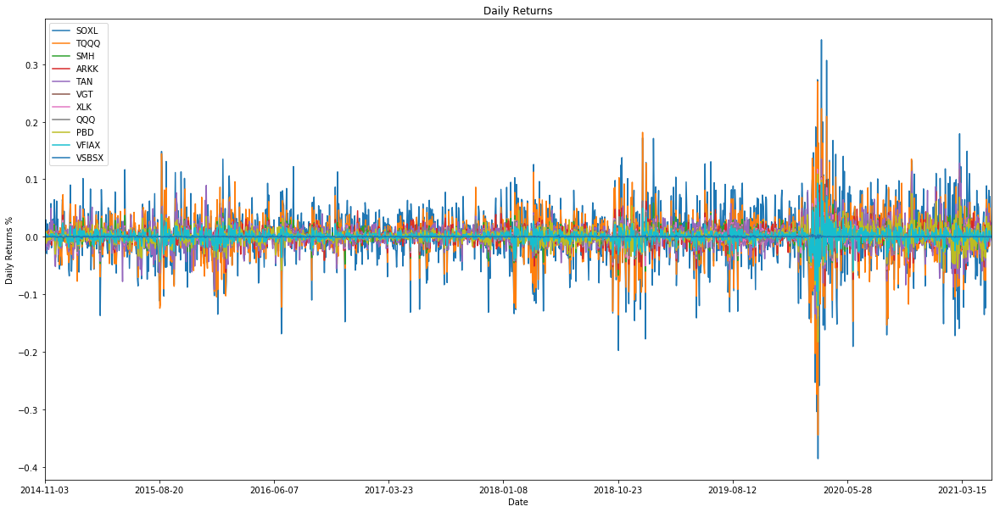

In [37]:
top_etf_rtn_plot = top_etf_rtn_df.plot(figsize=(20,10),title="Daily Returns")
top_etf_rtn_plot.set(ylabel='Daily Returns %')

In [38]:
# calculate cumulative returns
top_etf_cumrtn_df = (1 + top_etf_rtn_df).cumprod() - 1

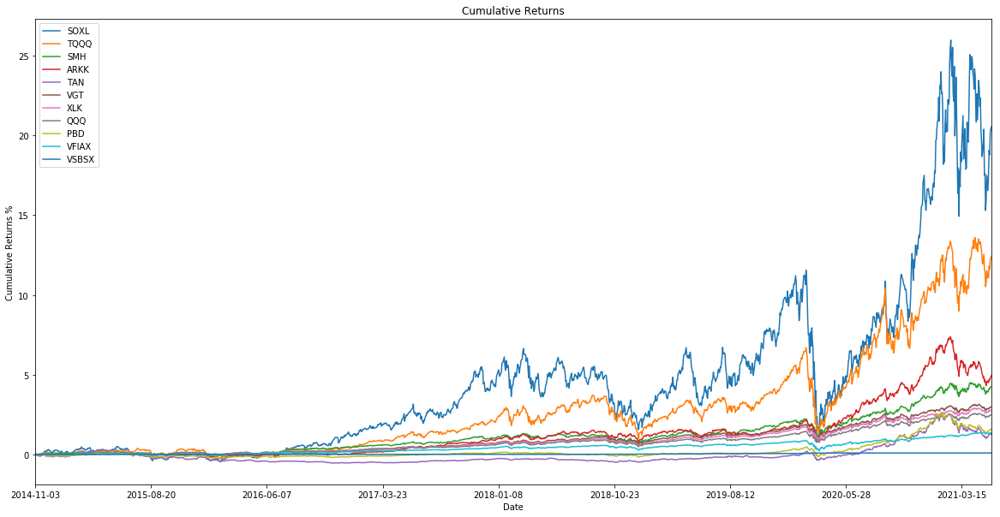

In [39]:
top_etf_cumrtn_plot = top_etf_cumrtn_df.plot(figsize=(20,10),title="Cumulative Returns")
top_etf_cumrtn_plot.set(ylabel='Cumulative Returns %')
plt.savefig('top_etf_cumrtn_plot.png')

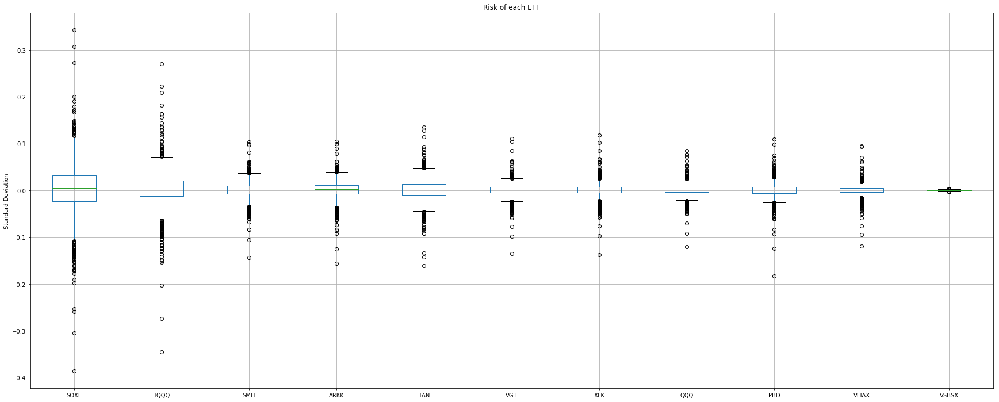

In [40]:
# Calculate and graph Standard Deviation for each ETF
top_etf_stddev_plot = top_etf_rtn_df.plot.box(figsize=(30,12), title='Risk of each ETF', grid=True)
top_etf_stddev_plot.set(ylabel='Standard Deviation')
plt.savefig('top_etf_stddev_plot.png')

In [41]:
# Calculate standard deviations
top_etf_daily_sd = top_etf_rtn_df.std()
top_etf_daily_sd

SOXL     0.053795
TQQQ     0.039511
SMH      0.017786
ARKK     0.019431
TAN      0.022896
VGT      0.014317
XLK      0.014288
QQQ      0.013395
PBD      0.015661
VFIAX    0.011525
VSBSX    0.000609
dtype: float64

In [42]:
# Calc Annualised Standard Deviation
trading_days = 252
top_etf_annualised_sd = top_etf_daily_sd * np.sqrt(trading_days)
top_etf_annualised_sd

SOXL     0.853967
TQQQ     0.627210
SMH      0.282336
ARKK     0.308454
TAN      0.363464
VGT      0.227273
XLK      0.226815
QQQ      0.212634
PBD      0.248606
VFIAX    0.182955
VSBSX    0.009674
dtype: float64

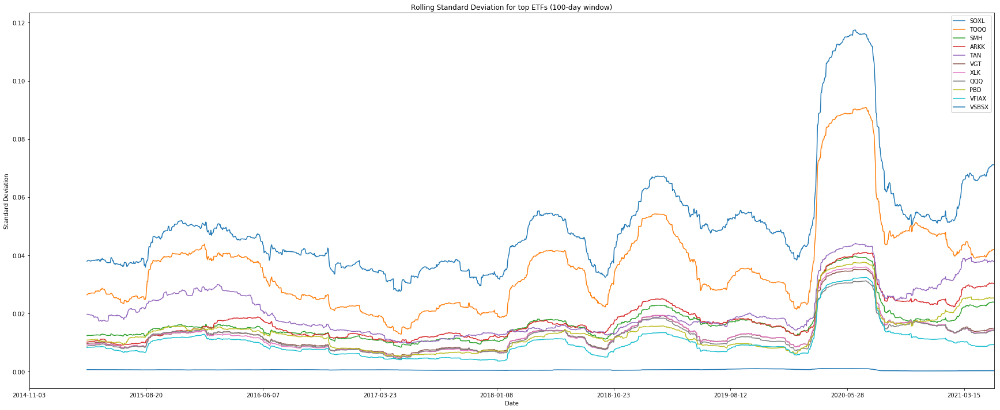

In [43]:
# Do rolling standard deviation, over 100 days
top_etf_rolling_sd = top_etf_rtn_df.rolling(window=100).std()
top_etf_roll_std_plot = top_etf_rolling_sd.plot(figsize=(30,12), title='Rolling Standard Deviation for top ETFs (100-day window)')
top_etf_roll_std_plot.set(ylabel='Standard Deviation')
plt.savefig('top_etf_roll_std_plot.png')

In [44]:
# Review correlation between ETFs
top_etf_corr = top_etf_rtn_df.corr()
# Display the correlation matrix
top_etf_corr


,SOXL,TQQQ,SMH,ARKK,TAN,VGT,XLK,QQQ,PBD,VFIAX,VSBSX
SOXL,1.000000,0.856168,0.988372,0.742727,0.625147,0.883272,0.870429,0.853456,0.697620,0.813432,-0.294695
TQQQ,0.856168,1.000000,0.858973,0.789322,0.612052,0.977835,0.976514,0.998578,0.697048,0.920705,-0.319597
SMH,0.988372,0.858973,1.000000,0.743621,0.626114,0.885252,0.874920,0.858956,0.708296,0.815945,-0.294212
ARKK,0.742727,0.789322,0.743621,1.000000,0.636309,0.788057,0.761915,0.787662,0.683531,0.717261,-0.220089
TAN,0.625147,0.612052,0.626114,0.636309,1.000000,0.624790,0.604570,0.612695,0.802874,0.619218,-0.201375
VGT,0.883272,0.977835,0.885252,0.788057,0.624790,1.000000,0.994812,0.977058,0.716917,0.929112,-0.330340
XLK,0.870429,0.976514,0.874920,0.761915,0.604570,0.994812,1.000000,0.976491,0.703327,0.933409,-0.328648
QQQ,0.853456,0.998578,0.858956,0.787662,0.612695,0.977058,0.976491,1.000000,0.697161,0.922226,-0.325691
PBD,0.697620,0.697048,0.708296,0.683531,0.802874,0.716917,0.703327,0.697161,1.000000,0.740848,-0.208996
VFIAX,0.813432,0.920705,0.815945,0.717261,0.619218,0.929112,0.933409,0.922226,0.740848,1.000000,-0.363610


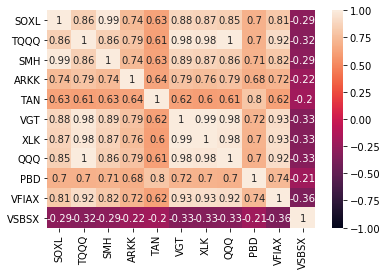

In [45]:
# Display the correlation matrix
top_etf_corr_plot = sns.heatmap(top_etf_corr, vmin=-1, vmax=1, annot=True)


In [46]:
# Analyse Sharpe Ratio
#sharpe ratio = (expected return of portfolio returns - risk-free rate) / standard deviation of portfolio returns

annual_sharpe_ratios = (top_etf_rtn_df.mean() - 0) / top_etf_annualised_sd  # -- assumption: risk-free rate is 0
print(annual_sharpe_ratios)

SOXL     0.003907
TQQQ     0.003779
SMH      0.004120
ARKK     0.004121
TAN      0.002121
VGT      0.004137
XLK      0.004000
QQQ      0.003983
PBD      0.002825
VFIAX    0.003212
VSBSX    0.006011
dtype: float64


[Text(0, 0.5, 'Sharpe Ratio')]

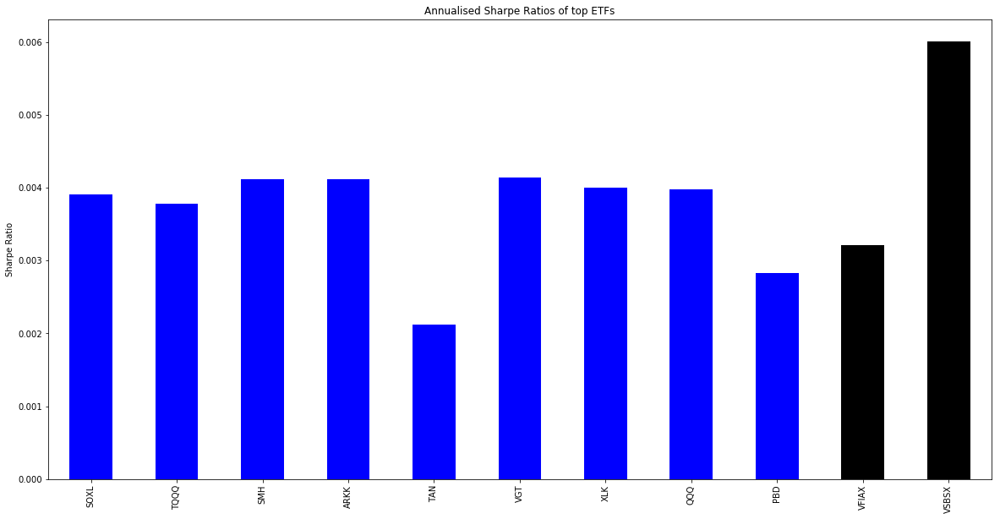

In [47]:
# Graph Sharpe Ratios
ann_sharpe_ratio_plot = annual_sharpe_ratios.plot.bar(figsize=(20,10), title='Annualised Sharpe Ratios of top ETFs', color=['blue','blue','blue','blue','blue','blue','blue','blue','blue','black','black'])  # -- or annualised_sharpe_ratios.plot(kind='bar'...etc.)
ann_sharpe_ratio_plot.set(ylabel='Sharpe Ratio')

In [48]:
# Bivariate plot (HvPlot) SOXL vs TQQQ
top_etf_close_df.hvplot.bivariate(x='SOXL', y='TQQQ', width=600, height=500)

:Bivariate   [SOXL,TQQQ]   (Density)

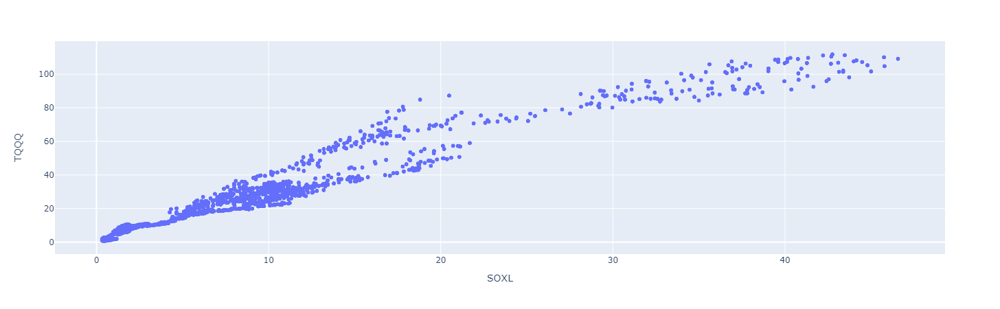

In [49]:
# Plotly scatter of SOXL vs TQQQ
fig = px.scatter(close_df, x="SOXL", y="TQQQ")
fig.show()

# Mapping Data and Sustainability

In [50]:
pip install yfinance --upgrade --no-cache-dir

Requirement already up-to-date: yfinance in c:\users\ikki_\anaconda3\envs\pyvizenv\lib\site-packages (0.1.59)
Note: you may need to restart the kernel to use updated packages.


In [51]:
# Additional imports
import os
import requests
import ast
import yfinance as yf
import panel as pn
from dotenv import load_dotenv
load_dotenv()

#import matplotlib.pyplot as plt
#%matplotlib inline

# Data used for countries and lat/long 
# https://developers.google.com/public-data/docs/canonical/countries_csv

# Data used to connect list of stock exchanges by country
# https://stockmarketmba.com/globalstockexchanges.php

True

In [52]:
#yfinance example (MSFT)
msft = yf.Ticker("MSFT")

# get stock info
msft.info

# get historical market data
hist = msft.history(period="max")

# show sustainability
sust = msft.sustainability

In [53]:
#ESG Score
sust.loc["totalEsg"].item()

14.63

In [54]:
#Example output of sustainability info
sust.head(5)

,Value
2021-5,
palmOil,False
controversialWeapons,False
gambling,False
socialScore,9.37
nuclear,False


In [55]:
#Rapid API - test MSFT data

rapid_api_key = os.getenv("X-RapidAPI-Key")

url = "https://esg-environmental-social-governance-data.p.rapidapi.com/search"

querystring = {"q":"MSFT"}

headers = {
    'x-rapidapi-key': rapid_api_key,  
    'x-rapidapi-host': "esg-environmental-social-governance-data.p.rapidapi.com"
    }

response = requests.request("GET", url, headers=headers, params=querystring)

print(response.text)

[{"esg_id":4720,"company_name":"Microsoft Corporation","exchange_symbol":"NASDAQ","stock_symbol":"MSFT","environment_grade":"B","environment_level":"Medium","social_grade":"B","social_level":"Medium","governance_grade":"B","governance_level":"Medium","total_grade":"B","total_level":"Medium","disclaimer":"ESG Enterprise\u0027s ESG Rating data (\u0022Scores\u0022) are all based on public information and provided for informational purposes only. No member of ESG Enterprise or related parties make any prediction, warranty or representation whatsoever, expressly or impliedly, either as to the suitability of our Scores for any particular purposes or the validity of any derivative analysis or conclusion based on the Scores.","last_processing_date":"31-05-2021","environment_score":220,"social_score":207,"governance_score":210,"total":637}]


In [56]:

r2 = ast.literal_eval(response.text)
type(r2)

list

In [57]:
#Total ESG score
r2[0]['total']

637

In [58]:
#Set ticker list to be mapped
ticker = ["MSFT", "AAPL", "TSLA", "AEF", "SHOP", "AL", "FTE"]

In [59]:
ticker_df = pd.DataFrame(ticker)
ticker_df

,0
0,MSFT
1,AAPL
2,TSLA
3,AEF
4,SHOP
5,AL
6,FTE


In [60]:
#Rapid API - pull in data for all tickers

url = "https://esg-environmental-social-governance-data.p.rapidapi.com/search"

headers = {
    'x-rapidapi-key': rapid_api_key,
    'x-rapidapi-host': "esg-environmental-social-governance-data.p.rapidapi.com"
    }

querystring = {"q":[ticker]}

ticker_request = (requests.request("GET", url, headers=headers, params=querystring)).text

esg_score = ast.literal_eval(ticker_request)
esg_score[0]['total']
print('')

In [61]:
#Set iteration loop for tickers
esg_data = []
exchange_data = []

for tickers in ticker:
    querystring = {"q":[tickers]}
    ticker_request = (requests.request("GET", url, headers=headers, params=querystring)).text
    esg_score = ast.literal_eval(ticker_request)[0]['total']
    exchange = ast.literal_eval(ticker_request)[0]['exchange_symbol']
    esg_data.append(esg_score)
    exchange_data.append(exchange)
    print(tickers, esg_score, exchange)

MSFT 637 NASDAQ
AAPL 646 NASDAQ
TSLA 705 NASDAQ
AEF 1301 ASX
SHOP 1072 OTCMKTS
AL 617 NYSE
FTE 805 BKK


In [62]:
ticker_df["ESG Score"] = esg_data
ticker_df["Exchange"] = exchange_data
ticker_df.columns = ["Company", "ESG Score", "Exchange"]
ticker_df.set_index("Company", inplace=True)
ticker_df

,ESG Score,Exchange
Company,,
MSFT,637,NASDAQ
AAPL,646,NASDAQ
TSLA,705,NASDAQ
AEF,1301,ASX
SHOP,1072,OTCMKTS
AL,617,NYSE
FTE,805,BKK


In [63]:
# Read the Mapbox API key
map_box_api = os.getenv("MAPBOX_API_TOKEN")

# Set the Mapbox API
px.set_mapbox_access_token(map_box_api)

In [64]:
# Import country latitude and longitude - note need to change file path to resources folder in github
countries = pd.read_csv("Countries.csv")
del countries['country']
countries.rename(columns={'name': 'Country'}, inplace=True)
countries.rename(columns={'latitude': 'Latitude'}, inplace=True)
countries.rename(columns={'longitude': 'Longitude'}, inplace=True)
countries.set_index('Country', inplace=True)

countries.head(5)

,Latitude,Longitude
Country,,
Andorra,42.546245,1.601554
United Arab Emirates,23.424076,53.847818
Afghanistan,33.939110,67.709953
Antigua and Barbuda,17.060816,-61.796428
Anguilla,18.220554,-63.068615


In [65]:
# Test country loc - longitude
countries.loc['Anguilla'][1]

-63.068615

In [66]:
global_exchanges = pd.read_csv("Global_Stock_Exchanges.csv")
del global_exchanges['Bloomberg Exchange Code']
del global_exchanges['Bloomberg Composite Code']
del global_exchanges['Description']
del global_exchanges['ISO MIC']
del global_exchanges['EOD code']
del global_exchanges['# of Stocks']
global_exchanges.rename(columns={'Google Prefix': 'Exchange'}, inplace=True)
global_exchanges = global_exchanges.dropna()
global_exchanges.set_index('Country', inplace=True)

# Add columns into df for latitude and longitude
global_exchanges['Latitude'] = np.nan
global_exchanges['Longitude'] = np.nan

global_exchanges.head(5)

,Exchange,Latitude,Longitude
Country,,,
Australia,ASX,NaN,NaN
Austria,VIE,NaN,NaN
Belgium,EBR,NaN,NaN
Brazil,BVMF,NaN,NaN
Canada,TSE,NaN,NaN


In [67]:
for Country in global_exchanges.index:
    if Country in countries.index:
        lat = countries.loc[Country]['Latitude']
        lon = countries.loc[Country]['Longitude']
        global_exchanges.loc[Country, 'Latitude'] = lat
        global_exchanges.loc[Country, 'Longitude'] = lon
    else: 
        print(Country)

In [68]:
#Bring country into the dataframe
global_exchanges["Country"] = global_exchanges.index
global_exchanges.head(5)

,Exchange,Latitude,Longitude,Country
Country,,,,
Australia,ASX,-25.274398,133.775136,Australia
Austria,VIE,47.516231,14.550072,Austria
Belgium,EBR,50.503887,4.469936,Belgium
Brazil,BVMF,-14.235004,-51.925280,Brazil
Canada,TSE,56.130366,-106.346771,Canada


In [69]:
ticker_df2 = ticker_df.merge(global_exchanges.drop_duplicates(), how="inner", left_on="Exchange", right_on = "Exchange")
ticker_df2.index = ticker_df.index
ticker_df2.head(10)

,ESG Score,Exchange,Latitude,Longitude,Country
Company,,,,,
MSFT,637,NASDAQ,37.090240,-95.712891,United States
AAPL,646,NASDAQ,37.090240,-95.712891,United States
TSLA,705,NASDAQ,37.090240,-95.712891,United States
AEF,1301,ASX,-25.274398,133.775136,Australia
SHOP,1072,OTCMKTS,37.090240,-95.712891,United States
AL,617,NYSE,37.090240,-95.712891,United States
FTE,805,BKK,15.870032,100.992541,Thailand


In [70]:
# Possible groupby country then for average ESG Score than plot on the map
country_esg = ticker_df2.groupby("Country").mean()
country_esg["Country"] = country_esg.index
country_esg

,ESG Score,Latitude,Longitude,Country
Country,,,,
Australia,1301.0,-25.274398,133.775136,Australia
Thailand,805.0,15.870032,100.992541,Thailand
United States,735.4,37.090240,-95.712891,United States


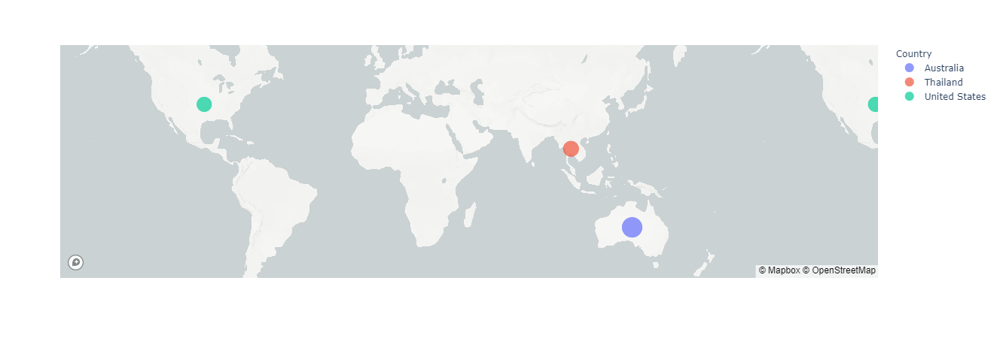

In [71]:
# What is the average sustainability score per country?
map_plot = px.scatter_mapbox(
    country_esg,
    lat="Latitude",
    lon="Longitude",
    size="ESG Score",
    color="Country",
    zoom=0.8
)

# Display the map
map_plot.show()

In [72]:
# What are the most sustainable companies?
esg_sorted = pd.DataFrame(ticker_df2["ESG Score"])
esg_sorted = esg_sorted.sort_values("ESG Score", ascending=False)
esg_sorted.hvplot.bar(color="green")

:Bars   [Company]   (ESG Score)

In [73]:
rawetfcount = pd.read_csv('Etf count by region.csv')
etfcount = rawetfcount.set_index('Country')
etfcount.head()

,ETFs
Country,
Argentina,3
Australia,4
Austria,1
Belgium,1
Brazil,8


In [74]:
mapbox_it1 = pd.read_csv('mapbox_it1.csv')
mapbox_it2 = mapbox_it1.set_index('Country')
del mapbox_it2['Country.1']

In [75]:
mapbox_it3 = mapbox_it2.reset_index()

In [76]:
import plotly.graph_objects as go

In [77]:
mapbox_plot = px.scatter_mapbox(mapbox_it3, 
                         lat='Latitude', 
                         lon='Longitude', 
                         hover_name = 'Country', 
                         hover_data=['Exchange','ETFs'],
                        size = 'ETFs',
                        title = 'Amount of ETFs traded in US by region (excluding US)',
                        zoom = 0,
                         color = 'Country',
                         range_color = [0,1],
                         center = go.layout.mapbox.Center(lat=25,lon=0)
                        )

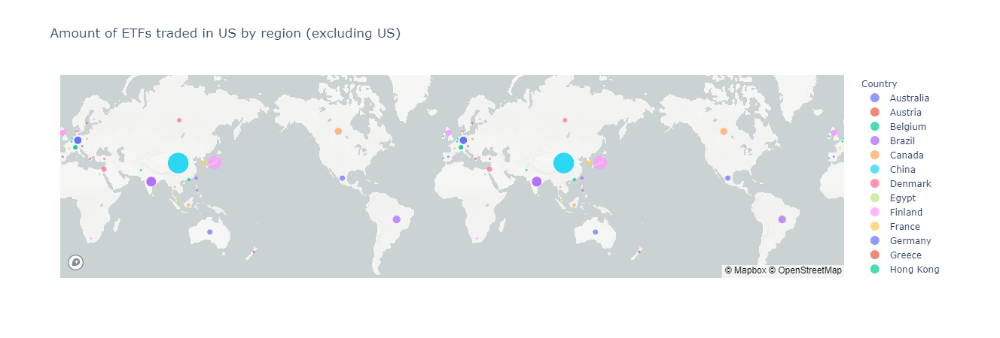

In [78]:
mapbox_plot.show()

In [79]:
etfcount['ETFs'].sum()

1748

In [80]:
etfcount = {'Region': ['U.S.', "Worldwide"], 'ETF Count': [1565,1755]}

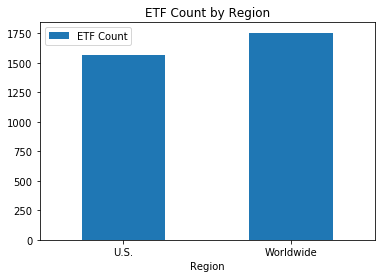

In [81]:
etfbar = pd.DataFrame(data = etfcount)
etfbar.plot.bar(x='Region', y='ETF Count', title = 'ETF Count by Region', rot = 0)
plt.savefig('ETF by region barplot.png')

In [82]:
def top_etf_rtn_plot_f():
    top_etf_rtn_df = top_etf_close_df.pct_change()
    #plt_fig1 = plt.figure()
    #plt.close(plt_fig1)
    fig1 = top_etf_rtn_df.plot(figsize=(20,10))
    fig1.set_ylabel('Daily Returns %')
    fig1.set_title("Daily Returns of Top ETFs over 7 years")
    #fig1 = pn.pane.Matplotlib(plt_fig1)
    plt.close(fig1.figure)
    return fig1.figure

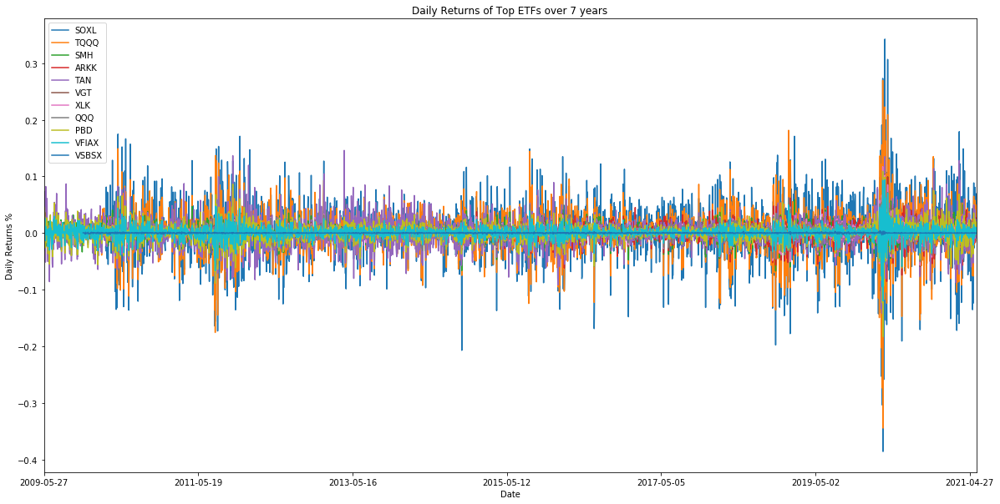

In [83]:
top_etf_rtn_plot_f()

In [84]:
def top_etf_cumrtn_plot_f():
    #plt_fig2 = plt.figure()
    #plt.close(plt_fig2)
    fig2 = top_etf_cumrtn_df.plot(figsize=(20,10))
    fig2.set_xlabel('Date', fontsize = 16, fontweight = 'bold')
    fig2.set_ylabel('Cumulative Returns %', fontsize = 16, fontweight = 'bold')
    fig2.set_title("Cumulative Daily Returns of Top ETFs over 7 years", fontsize = 16, fontweight = 'bold')
    #fig2 = pn.pane.Matplotlib(plt_fig2)
    plt.close(fig2.figure)
    return fig2.figure

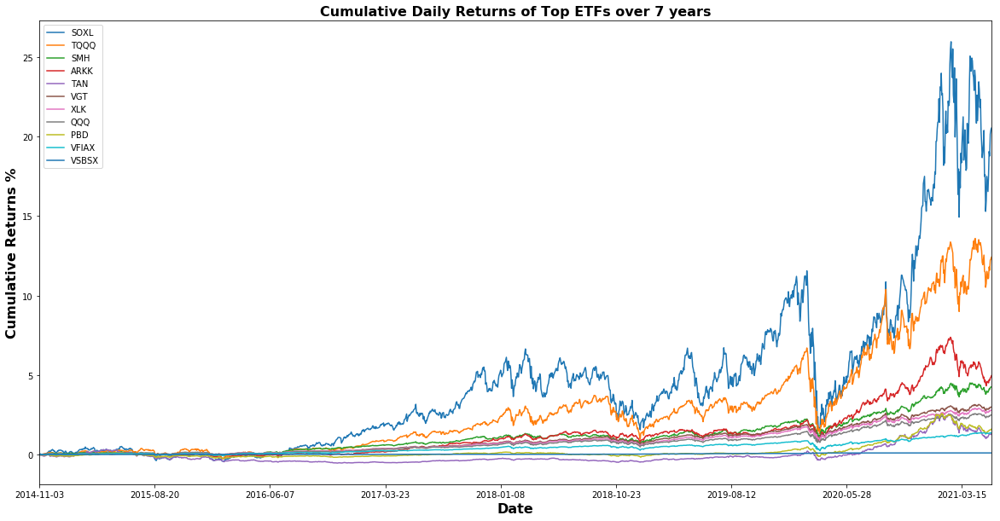

In [85]:
top_etf_cumrtn_plot_f()

In [86]:
def top_etf_rtn_box_f():
    #plt_fig3 = plt.figure()
    #plt.close(plt_fig3)
    fig3 = top_etf_rtn_df.plot.box(figsize=(30,12), grid=True)
    fig3.set_ylabel('Standard Deviation', fontsize = 24, fontweight = 'bold')
    fig3.set_title("Risk of Each ETF", fontsize = 24, fontweight = 'bold')
    #fig3 = pn.pane.Matplotlib(plt_fig3)
    plt.close(fig3.figure)
    return fig3.figure

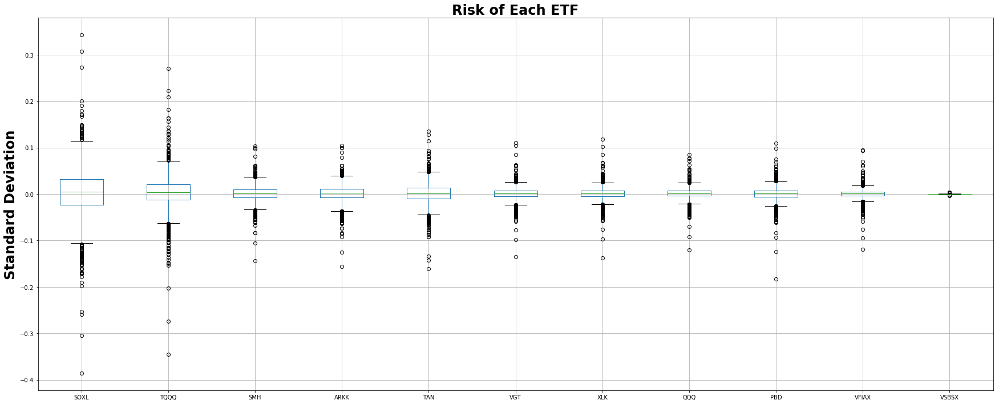

In [87]:
top_etf_rtn_box_f()

In [88]:
def ann_sharpe_ratio_plot_f():
    #plt_fig4 = plt.figure()
    #plt.close(plt_fig4)
    fig4 = annual_sharpe_ratios.plot.bar(figsize=(20,10), color=['blue','blue','blue','blue','blue','blue','blue','blue','blue','black','black'])
    fig4.set_xlabel('ETF Ticker', fontsize = 16, fontweight = 'bold')
    fig4.set_title("Annualised Sharpe Ratios of top ETFs", fontsize = 16, fontweight = 'bold')
    #fig4 = pn.pane.Matplotlib(plt_fig4)
    plt.close(fig4.figure)
    return fig4.figure

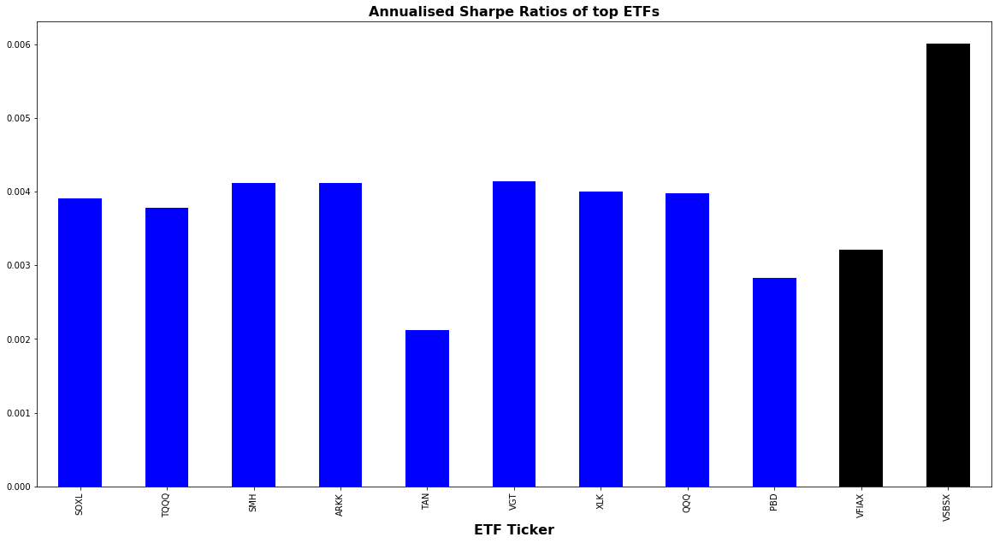

In [89]:
ann_sharpe_ratio_plot_f()

In [90]:
def top_etf_close_df_f():
    fig5 = top_etf_close_df.hvplot.bivariate(
                                            x='SOXL', 
                                            y='TQQQ', 
                                            width=600, 
                                            height=500, 
                                            title = 'Correlation of SOXL vs TQQQ')
    return fig5

In [91]:
top_etf_close_df_f()

:Bivariate   [SOXL,TQQQ]   (Density)

In [92]:
def scatter_f():
    fig6 = px.scatter(close_df, x="SOXL", y="TQQQ", title ='Close Price Comparison')
    return fig6

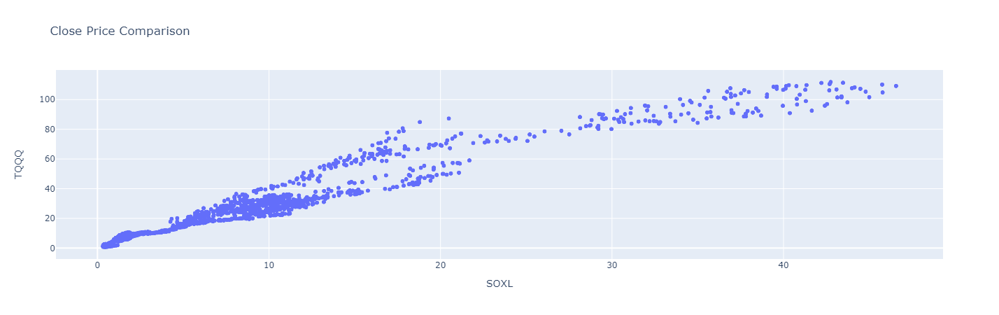

In [93]:
scatter_f()

In [94]:
def esg_sorted_f():
    fig7 = esg_sorted.hvplot.bar(color = 'green', title = 'Company by ESG Score')
    return fig7

In [95]:
esg_sorted_f()

:Bars   [Company]   (ESG Score)

In [96]:
def mapbox_plot_f():
    mb_map = px.scatter_mapbox(mapbox_it3,
                lat='Latitude',
                lon='Longitude',
                hover_name = 'Country',
                hover_data=['Exchange','ETFs'],
                size = 'ETFs',
                title = 'Amount of ETFs traded in US by region (excluding US)',
                zoom = 0,
                color = 'Country',
                range_color = [0,1],
                center = go.layout.mapbox.Center(lat=25,lon=0))
    fig8 = pn.panel(mb_map)
    return fig8

In [97]:
mapbox_plot_f()

Plotly(Figure)

In [98]:
dash_title = pn.pane.Markdown(
    """
    # MGM Analysis
    <br>
    This dashboard consists of graphs that MGM has built show their research on the ETF landscape.
  
    <br>
    Graphs include, box, line, bivariate and mapbox plots. 
    Packages required include panel, pandas, hvplot, matplotlib, plotly.express, pathlib.
    Mapbox API token required.
    """)

#overview_msg = pn.pane.Markdown(

tab1 = pn.Column('Returns', top_etf_rtn_plot_f())
tab2 = pn.Column('Cumulative Returns', top_etf_cumrtn_plot_f())
tab3 = pn.Column('St Dev', top_etf_rtn_plot_f())
tab4 = pn.Column('Sharpe Ratio', ann_sharpe_ratio_plot_f())
tab5 = pn.Column('Bivariate Correlation', top_etf_close_df_f())
tab6 = pn.Column('Close Price Comparison', scatter_f())
tab7 = pn.Column('ESG', esg_sorted_f())
tab8 = pn.Column('Country Count', mapbox_plot_f())

dash_tabs = pn.Tabs(('Returns', tab1),
                   ('Cumulative Returns', tab2),
                   ('St Dev', tab3),
                   ('Sharpe Ratio', tab4),
                   ('Bivariate Correlation', tab5),
                   ('Close Price Comparison', tab6),
                   ('ESG', tab7),
                   ('Country Count', tab8)
                   )         

dashboard = pn.Column(pn.Row(dash_title), dash_tabs, width=1500)

Column(width=1500)
    [0] Row
        [0] Markdown(str)
    [1] Tabs
        [0] Column
            [0] Markdown(str)
            [1] Matplotlib(Figure)
        [1] Column
            [0] Markdown(str)
            [1] Matplotlib(Figure)
        [2] Column
            [0] Markdown(str)
            [1] Matplotlib(Figure)
        [3] Column
            [0] Markdown(str)
            [1] Matplotlib(Figure)
        [4] Column
            [0] Markdown(str)
            [1] HoloViews(Bivariate)
        [5] Column
            [0] Markdown(str)
            [1] Plotly(Figure)
        [6] Column
            [0] Markdown(str)
            [1] HoloViews(Bars)
        [7] Column
            [0] Markdown(str)
            [1] Plotly(Figure)
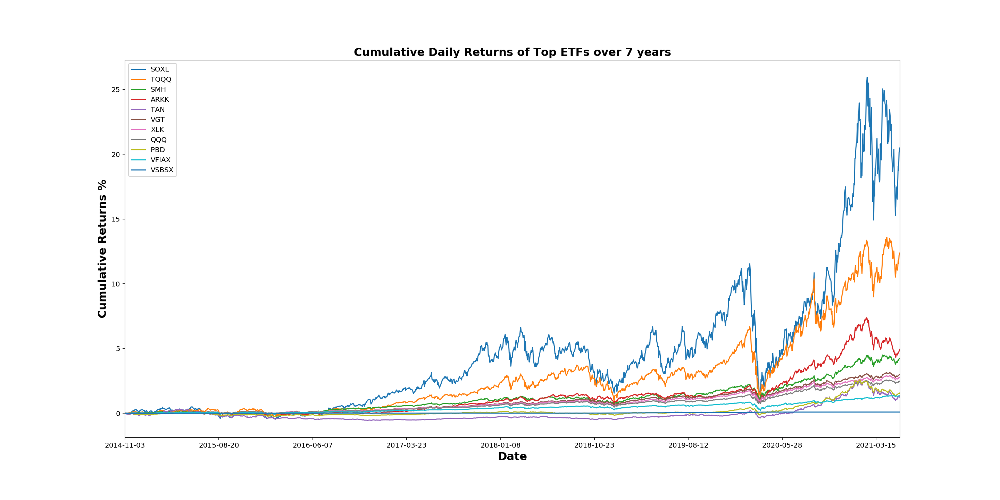
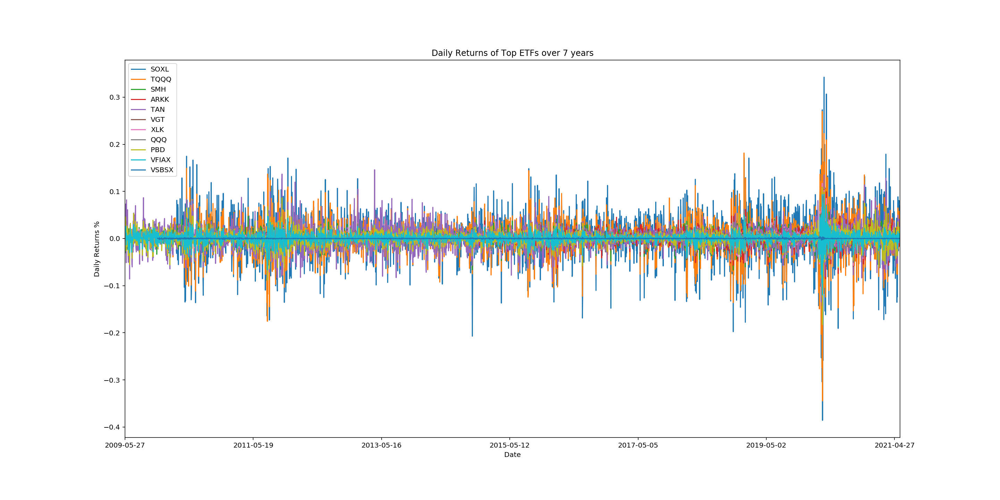
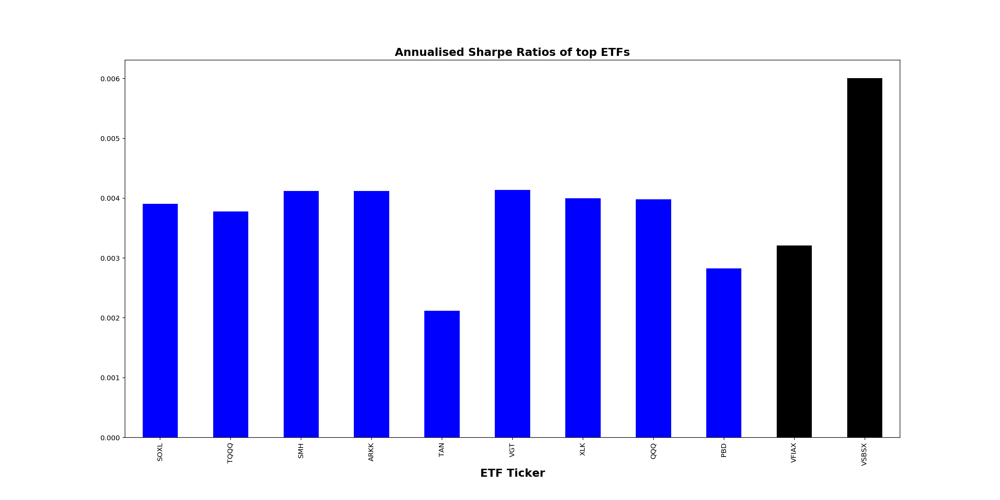
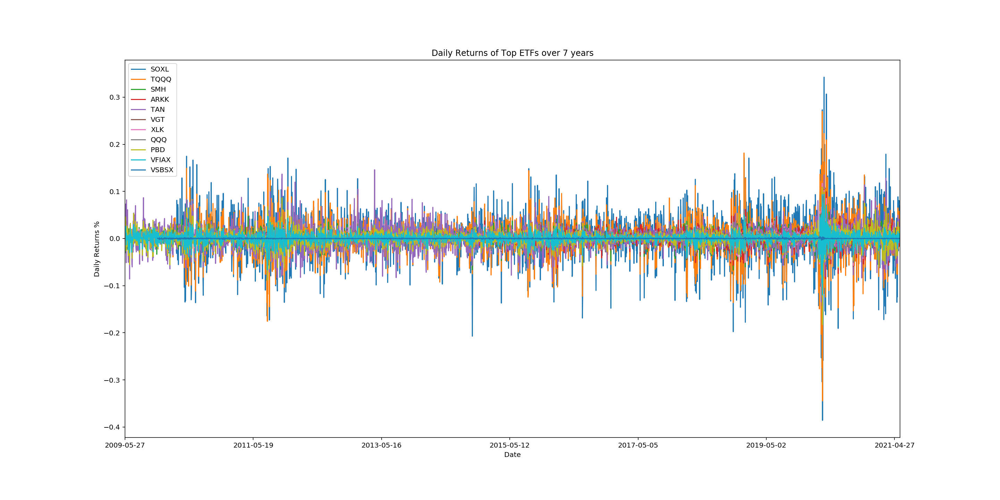

In [99]:
dashboard.servable()